In [2]:
%reload_ext autoreload
%autoreload 2
import pynwb
import os

#DataJoint and DataJoint schema
import datajoint as dj
import numpy as np
import pandas as pd

## We also import a bunch of tables so that we can call them easily

from spyglass.common import (RawPosition, HeadDir, Speed, LinPos, StateScriptFile, VideoFile,
                                  DataAcquisitionDevice, CameraDevice, Probe,
                                  DIOEvents,
                                  ElectrodeGroup, Electrode, Raw, SampleCount,
                                  LFPSelection, LFP, LFPBandSelection, LFPBand,
                                  FirFilter,
                                  IntervalList,
                                  Lab, LabMember, LabTeam, Institution,
                                  BrainRegion,
                                  SensorData,
                                  Session, ExperimenterList,
                                  Subject,
                                  Task, TaskEpoch,
                                  Nwbfile, AnalysisNwbfile, NwbfileKachery, AnalysisNwbfileKachery,
                                  get_electrode_indices)
from spyglass.common.common_position import (PositionInfoParameters,IntervalPositionInfo)
from spyglass.common.common_interval import interval_list_intersect



from plot_lfp import (get_x_y_list, get_speed, get_timestamps_and_data,get_electrode_ids,remove_dead_tet_chans,check_for_dead_probes,
                      checking_other_dead_tets,simple_plot,plot_overlay,plot_overlay_with_pos,plot_speed_versus_theta, find_overlapping_times,get_x_y_timestamp_list)

import re
import matplotlib.pyplot as plt
import warnings
from ripple_detection.detectors import Kay_ripple_detector

warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

Connecting emonroe@lmf-db.cin.ucsf.edu:3306


In [3]:
nwb_file_name = 'senor20201030_.nwb'

In [4]:
theta_timestamps, theta_data, theta_eseries = get_timestamps_and_data(nwb_file_name,filter_type=['Theta 5-11 Hz'],data_type = ['theta'])
lfp_timestamps, lfp_data, lfp_eseries = get_timestamps_and_data(nwb_file_name,data_type = ['lfp'])


position_info = (IntervalPositionInfo() &
                 {'nwb_file_name': nwb_file_name,
                  'interval_list_name': 'pos 1 valid times',
                  'position_info_param_name': 'default'}
                ).fetch1_dataframe()

In [4]:
electrode_id = [0,40,300]
time_from_start = 500 #in seconds
time_interval_s = 15
sampling_rate_lfp = 1000
epoch = (IntervalList & {'nwb_file_name':nwb_file_name} & {'interval_list_name':'02_r1'}).fetch1('valid_times')
x_elect_theta, y_elect_theta =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)

x_elect_lfp, y_elect_lfp = get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)





In [6]:
# from nwb_datajoint.common.signal_processing import hilbert_decomp
from scipy import signal



2

In [6]:
env,phase,freq =  hilbert_decomp(theta_eseries, 1000)

In [14]:
# analytical_signal = signal.hilbert(y_elect_theta, axis=0)



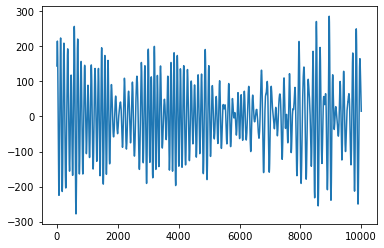

In [20]:
# analytical_signal[0][0]
# plt.plot(analytical_signal[0])

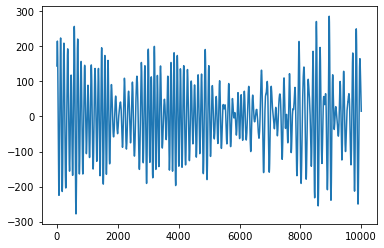

In [22]:
# plt.plot(y_elect_theta[0])

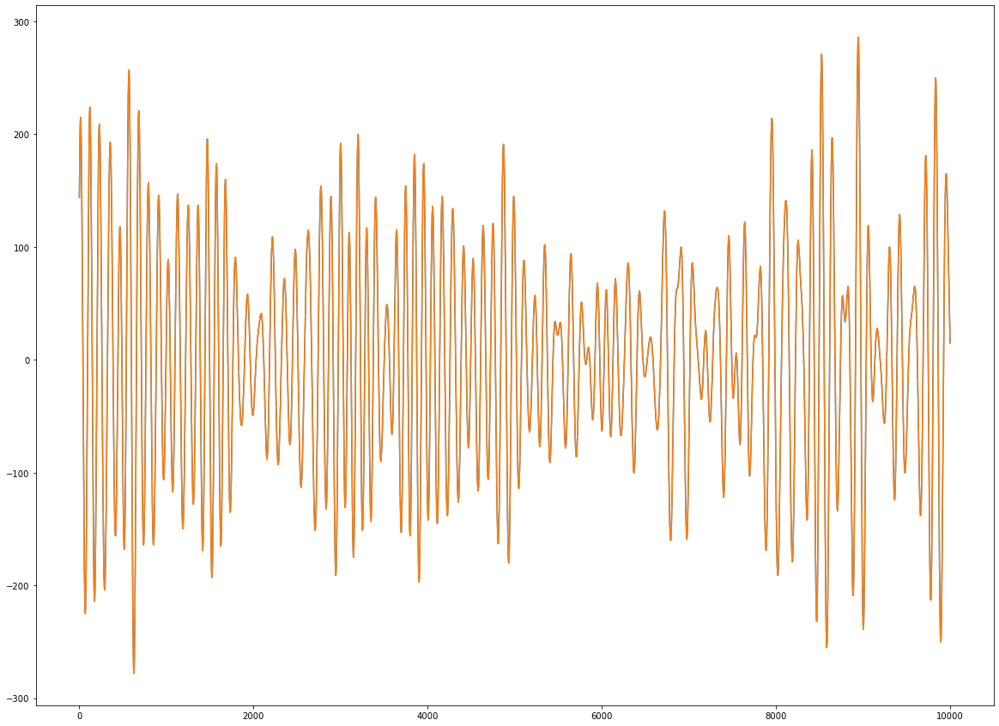

In [25]:
# plt.figure(figsize=(20,15))
# plt.plot(y_elect_theta[0])
# plt.plot(analytical_signal[0])

In [26]:
# instantaneous_phase = np.unwrap(np.angle(analytical_signal))

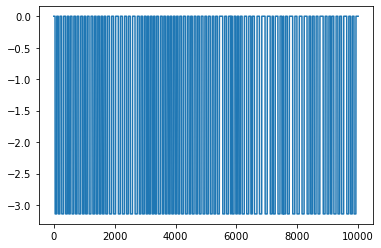

In [28]:
# plt.plot(instantaneous_phase[0])

In [30]:
# instantaneous_phase = np.unwrap(np.angle(analytical_signal))
# instantaneous_frequency = np.diff(
#         instantaneous_phase) / (2.0 * np.pi) * 1000

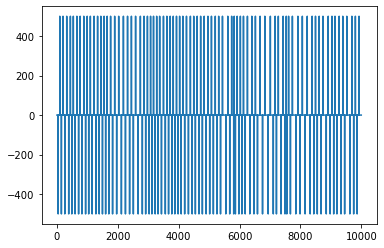

In [32]:
# plt.plot(instantaneous_frequency[0])

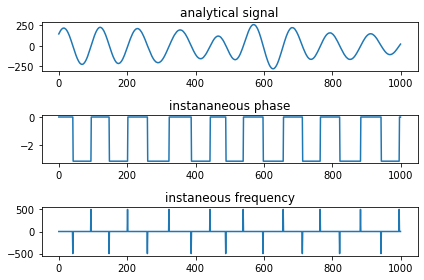

In [37]:
# fig,ax = plt.subplots(3)
# ax[0].plot(analytical_signal[0][0:1000])
# ax[1].plot(instantaneous_phase[0][0:1000])
# ax[2].plot(instantaneous_frequency[0][0:1000])
# ax[0].set_title('analytical signal')
# ax[1].set_title('instananeous phase')
# ax[2].set_title('instaneous frequency')
# fig.tight_layout()

In [70]:
# T = 1/1000
# N = len(y_elect_theta)
# yf = np.fft.fft(y_elect_theta[0])

# freq = np.fft.fftfreq(y_elect_theta[0].size, d=T)
# index, = np.where(np.isclose(freq, 12, atol=1/(T*N)))

# # Get magnitude and phase
# magnitude = np.abs(yf[index[0]])
# phase = np.angle(yf[index[0]])
# print("Magnitude:", magnitude, ", phase:", phase)

# # Plot a spectrum 
# plt.plot(freq[0:N//2], 2/N*np.abs(yf[0:N//2]), label='amplitude spectrum')   # in a conventional form
# plt.plot(freq[0:N//2], np.angle(yf[0:N//2]), label='phase spectrum')
# plt.legend()
# plt.grid()
# plt.show()

In [71]:
# y_elect_theta[0]
# len(index)
# plt.plot(freq)
# plt.plot(yf,alpha=.2)

In [72]:
# plt.figure(figsize=(20,10))
# # plt.plot(yf)
# yf[index[0]]

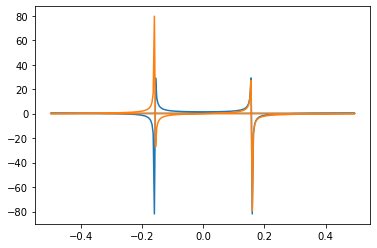

In [58]:
# t = np.arange(256)
# sp = np.fft.fft(np.sin(t))
# freq = np.fft.fftfreq(t.shape[-1])
# plt.plot(freq, sp.real, freq, sp.imag)
# # [<matplotlib.lines.Line2D object at 0x...>, <matplotlib.lines.Line2D object at 0x...>]
# plt.show()

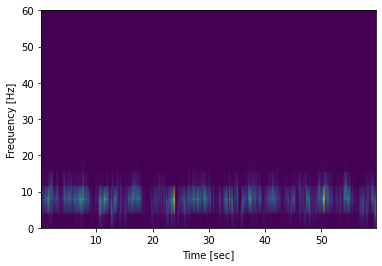

60000 <class 'numpy.ndarray'>


In [10]:
electrode_id = [40,300]
time_from_start = 500 #in seconds
time_interval_s = 60
sampling_rate_lfp = 1000
epoch = (IntervalList & {'nwb_file_name':nwb_file_name} & {'interval_list_name':'02_r1'}).fetch1('valid_times')
x_elect_theta, y_elect_theta =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)





f, t, Sxx = signal.spectrogram(y_elect_theta[0], 1000)
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0,60)
plt.show()

print(len(y_elect_theta[0]), type(y_elect_theta[0]))
# plt.plot(y_elect_theta[0])


In [ ]:
 # http://www.radio-science.net/2017/10/dynamic-spectrum-spectrogram-using.html
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.spectrogram.html

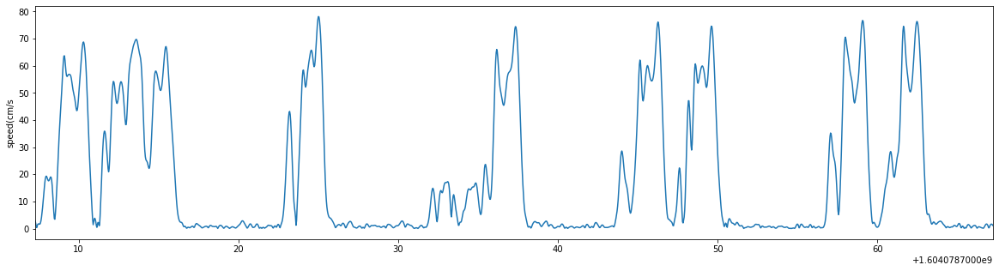

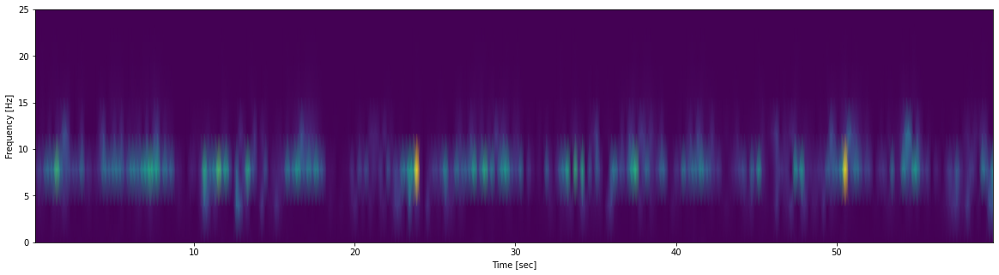

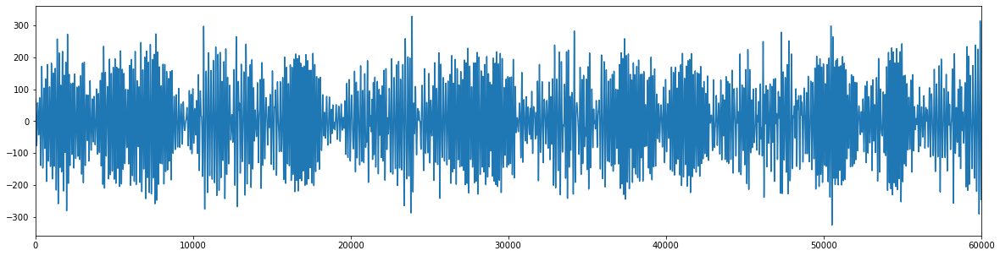

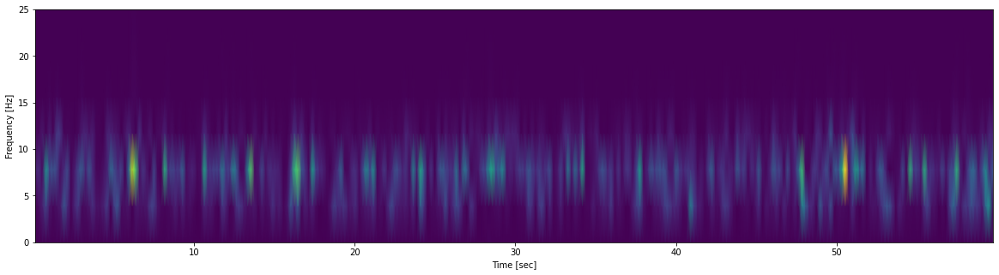

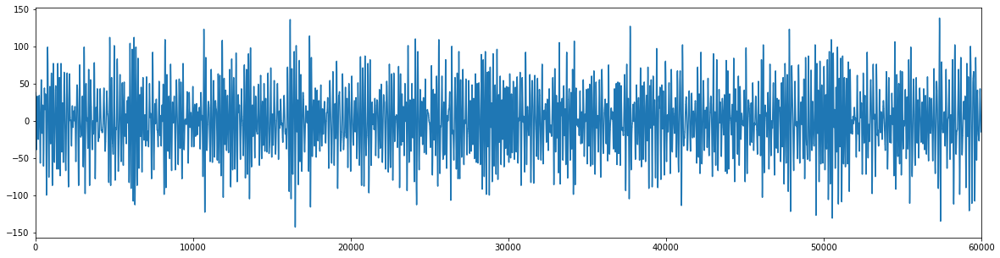

In [103]:
plt.figure(figsize=(20,5))
plt.plot(x_pos,y_pos)
plt.ylabel('speed(cm/s')
plt.xlim(x_pos.min(),x_pos.max())
for ix in range(len(y_elect_theta)):
    plt.figure(figsize=(20,5))
    f, t, Sxx = signal.spectrogram(y_elect_theta[ix], 1000)
    plt.pcolormesh(t, f, Sxx, shading='gouraud')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.ylim(0,25)
    plt.show()
    plt.figure(figsize=(20,5))
    plt.plot(y_elect_theta[ix])
    plt.xlim(0,len(y_elect_theta[ix]))





In [9]:
# signal.spectrogram?

In [8]:
# signal.coherence?

In [10]:
# x_pos.min()



In [113]:
from scipy.signal import hilbert, chirp
analytic_signal = hilbert(y_elect_theta[0])
amplitude_envelope = np.abs(analytic_signal)
instantaneous_phase = np.unwrap(np.angle(analytic_signal))
instantaneous_frequency = (np.diff(instantaneous_phase) /
                            (2.0*np.pi) * 1000)

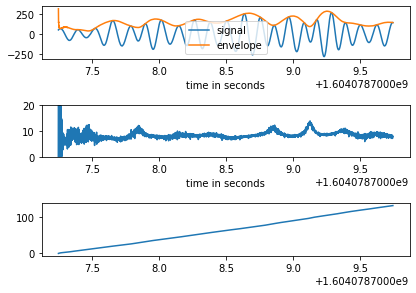

In [114]:
fig, (ax0, ax1,ax2) = plt.subplots(nrows=3)
ax0.plot(x_elect_theta[0][0:2500], y_elect_theta[0][0:2500], label='signal')
ax0.plot(x_elect_theta[0][0:2500], amplitude_envelope[0:2500], label='envelope')
ax0.set_xlabel("time in seconds")
ax0.legend()
ax1.plot(x_elect_theta[0][1:2500], instantaneous_frequency[1:2500])
ax1.set_xlabel("time in seconds")
ax1.set_ylim(0.0, 20.0)
fig.tight_layout()
ax2.plot(x_elect_theta[0][0:2500],instantaneous_phase[0:2500])

In [7]:
# plt.plot(instantaneous_phase)

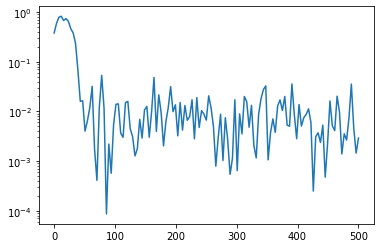

In [6]:
from scipy.signal import coherence


x = y_elect_theta[0]
y = y_elect_theta[1]

f, Cxy = coherence(x, y, fs=1000)
plt.semilogy(f, Cxy)

Text(0, 0.5, 'coherence')

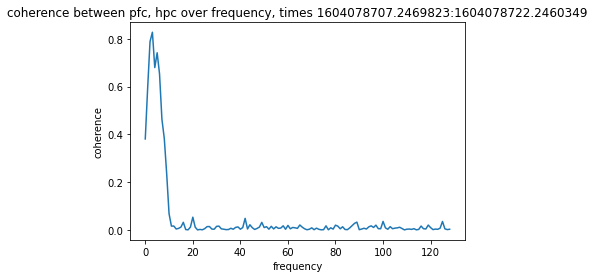

In [16]:
plt.plot(Cxy)
plt.title(f'coherence between pfc, hpc over frequency, times {x_elect_theta[0].min()}:{x_elect_theta[0].max()}')
plt.xlabel('frequency')
plt.ylabel('coherence')

In [14]:
x_elect_theta[0].min()

1604078707.2469823

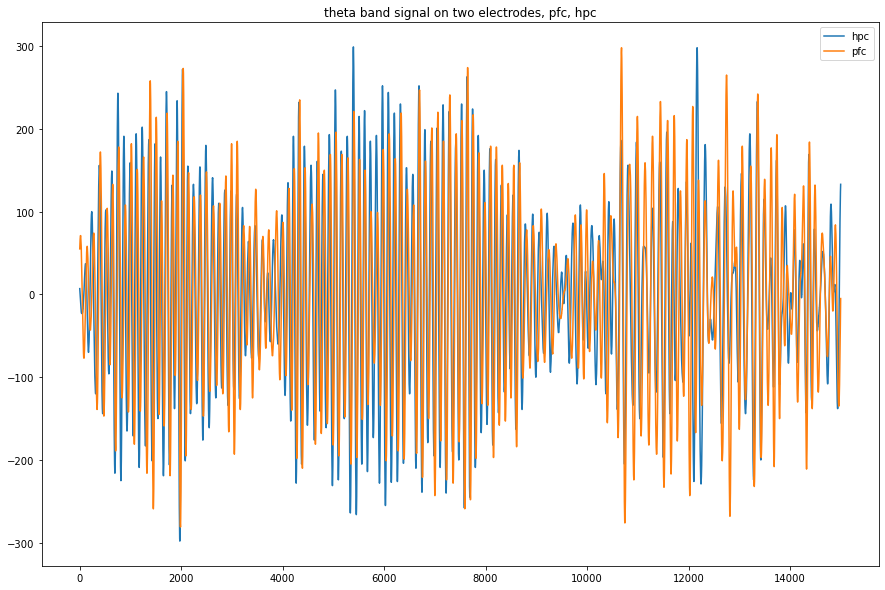

In [20]:
plt.figure(figsize=(15,10))
plt.plot(x,label='hpc')
plt.plot(y,label='pfc')
plt.title('theta band signal on two electrodes, pfc, hpc')
plt.legend()

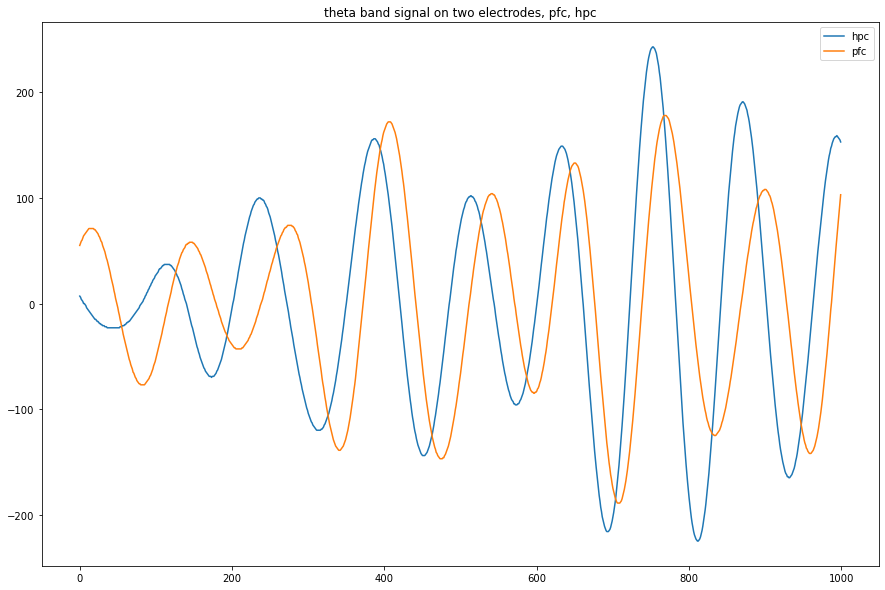

In [21]:
x_seg = x[0:1000]
y_seg = y[0:1000]
plt.figure(figsize=(15,10))
plt.plot(x_seg,label='hpc')
plt.plot(y_seg,label='pfc')
plt.title('theta band signal on two electrodes, pfc, hpc')
plt.legend()

Text(0, 0.5, 'coherence')

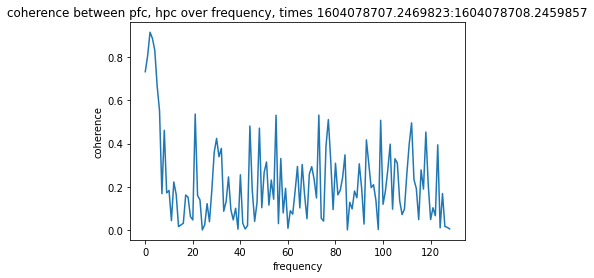

In [26]:
f, Cxy = coherence(x_seg, y_seg, fs=1000)

plt.plot(Cxy)
plt.title(f'coherence between pfc, hpc over frequency, times {x_elect_theta[0][0:1000].min()}:{x_elect_theta[0][0:1000].max()}')
plt.xlabel('frequency')
plt.ylabel('coherence')

In [ ]:
x_elect_theta[0][0:1000]

Text(0, 0.5, 'coherence')

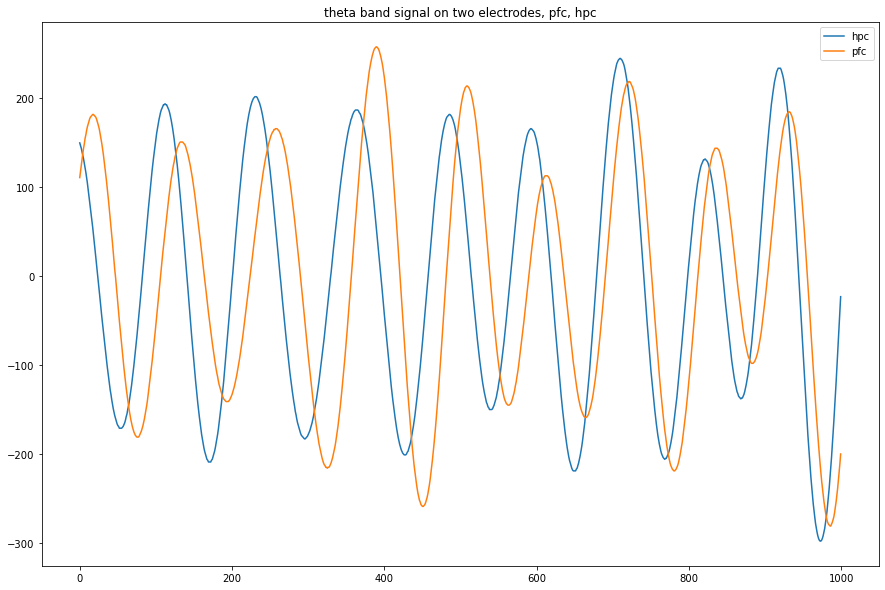

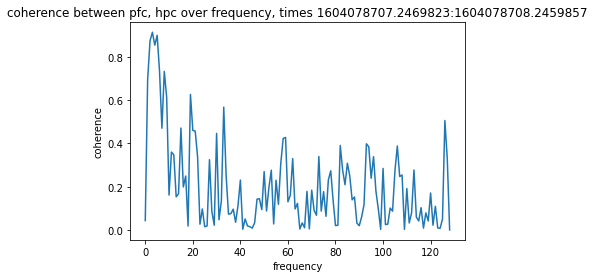

In [27]:
x_seg = x[1000:2000]
y_seg = y[1000:2000]
plt.figure(figsize=(15,10))
plt.plot(x_seg,label='hpc')
plt.plot(y_seg,label='pfc')
plt.title('theta band signal on two electrodes, pfc, hpc')
plt.legend()
plt.figure()
f, Cxy = coherence(x_seg, y_seg, fs=1000)

plt.plot(Cxy)
plt.title(f'coherence between pfc, hpc over frequency, times {x_elect_theta[0][0:1000].min()}:{x_elect_theta[0][0:1000].max()}')
plt.xlabel('frequency')
plt.ylabel('coherence')

#try to find a paper from the lab 
#shantanu jadhav , jai yu (did pfc, hpc) - time bins people are using! 
#stackoverflow - coherogram 
#maybe even some of the other papers from alison 
#check out the lfp scaling stuff, make sure there werent any loose endds 

In [29]:
from scipy import signal
analytical_signal = signal.hilbert(x_seg, axis=0)

In [30]:
instantaneous_phase = np.unwrap(np.angle(analytical_signal))
instantaneous_frequency = np.diff(
        instantaneous_phase) / (2.0 * np.pi) * 1000

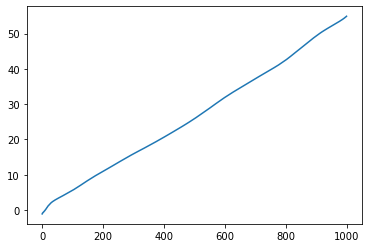

In [32]:
plt.plot(instantaneous_phase)

In [33]:
#http://www.rdgao.com/roemerhasit_Hilbert_Transform/

In [37]:
x_seg = x[0:2000]
x_a = signal.hilbert(x_seg)
t = x_elect_theta[0][0:2000]
fs=1000

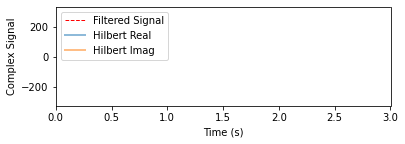

In [39]:
plt.subplot(2,1,2)
plt.plot(t,x_seg, '--r', label='Filtered Signal', alpha=1, lw=1)
plt.plot(t,x_a.real, label='Hilbert Real', alpha=0.5, lw=2)
plt.plot(t,x_a.imag, label='Hilbert Imag', alpha=0.5, lw=2)
plt.xlabel('Time (s)')
plt.ylabel('Complex Signal')
plt.legend(loc='upper left')
plt.xlim((0,3));

# selecting 2 slices of data
# t1 = 2650
# t2 = 2700
# yb = plt.ylim()
# plt.plot([t1/fs]*2, yb, 'k--')
# plt.plot([t2/fs]*2, yb, 'g--')
# plt.tight_layout()

Text(0, 0.5, 'amplitude(AD units)')

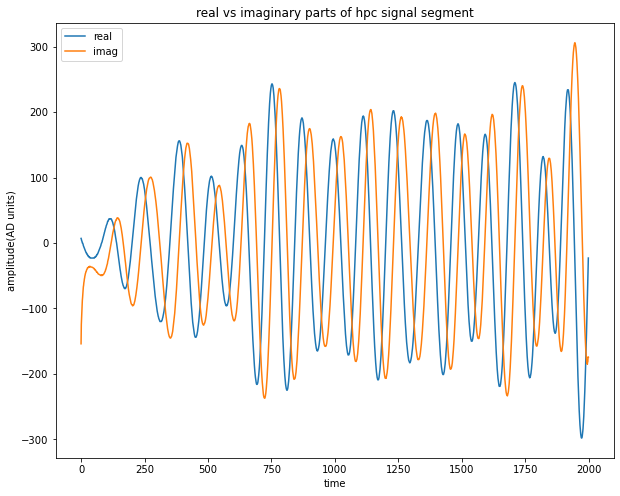

In [46]:
plt.figure(figsize=(10,8))
plt.plot(x_a.real,label='real')
plt.plot(x_a.imag,label='imag')
plt.legend()
plt.title('real vs imaginary parts of hpc signal segment')
plt.xlabel('time')
plt.ylabel('amplitude(AD units)')

Text(0.5, 0, 'Time (s)')

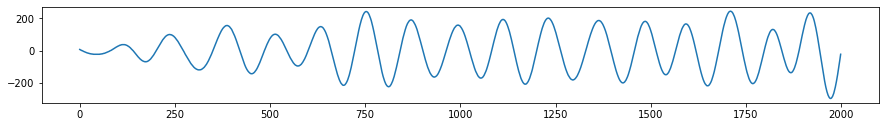

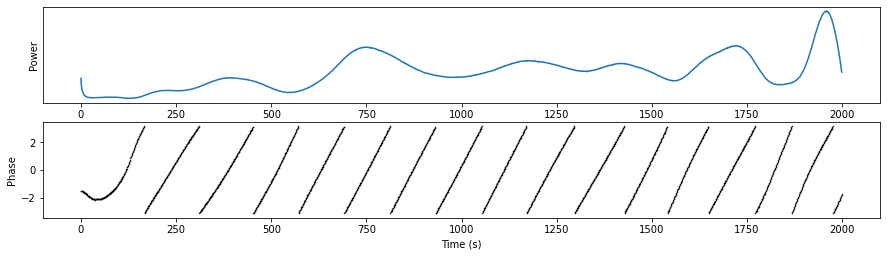

In [53]:
x_power = np.abs(x_a)**2
x_phase = np.angle(x_a)
# plotting

plt.figure(figsize=(15,6))
plt.subplot(3,1,1)
plt.plot(x_a.real)

plt.figure(figsize=(15,6))
plt.subplot(3,1,2)
plt.plot(x_power)
plt.yticks([])
plt.ylabel('Power')
# plt.xlim((0,3));

plt.subplot(3,1,3)
plt.plot(x_phase, '.k', ms=1)
plt.ylabel('Phase')
plt.xlabel('Time (s)')
# yb = plt.ylim()
# # plt.plot([t1/fs]*2, yb, 'k--')
# # plt.plot([t2/fs]*2, yb, 'g--')
# plt.xlim((0,3))
# plt.tight_layout()

#be able to describe/define coherence, what is it using (phase, amplitude etc)- super high level
#could do a rolling window kind of thing, but who knows if its the right thing to do.. many time bins, learning to plot a heat map. CHange bin size later.. what window did they use?  (the paper/citation 1999) 
#Is the theta band the pace to look at coherence (lfp?) 

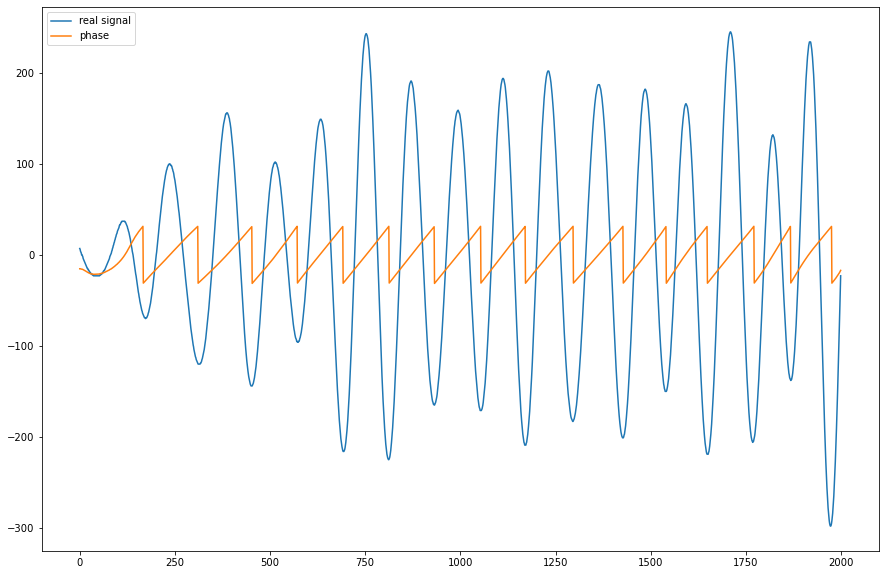

In [56]:
plt.figure(figsize=(15,10))
plt.plot(x_a.real,label='real signal')
plt.plot(x_phase*10, label='phase')
plt.legend()

In [57]:
y_seg = y[0:2000]
y_a = signal.hilbert(y_seg)
t = x_elect_theta[0][0:2000]
fs=1000

Text(0, 0.5, 'amplitude(AD units)')

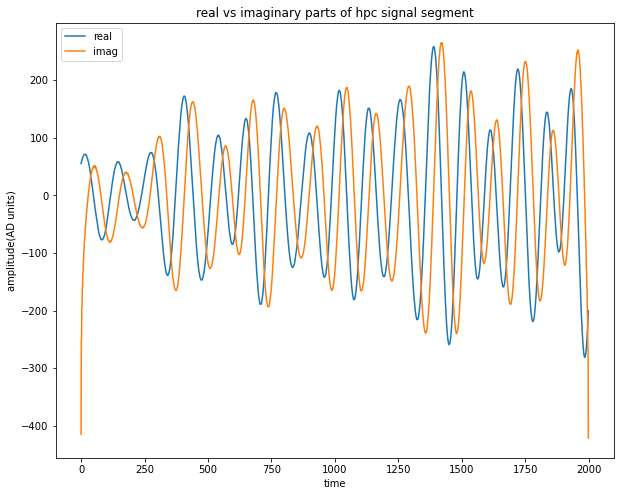

In [58]:
plt.figure(figsize=(10,8))
plt.plot(y_a.real,label='real')
plt.plot(y_a.imag,label='imag')
plt.legend()
plt.title('real vs imaginary parts of hpc signal segment')
plt.xlabel('time')
plt.ylabel('amplitude(AD units)')

Text(0.5, 0, 'Time (s)')

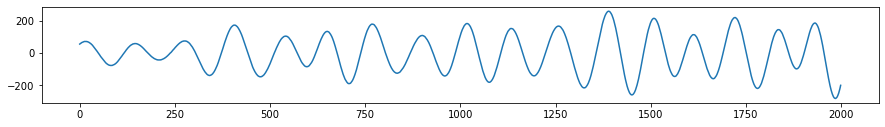

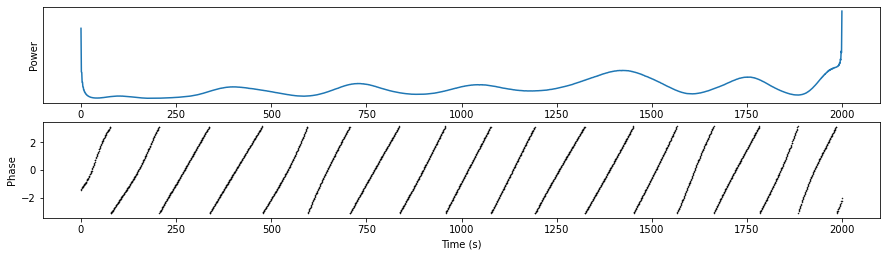

In [59]:
y_power = np.abs(y_a)**2
y_phase = np.angle(y_a)
# plotting

plt.figure(figsize=(15,6))
plt.subplot(3,1,1)
plt.plot(y_a.real)

plt.figure(figsize=(15,6))
plt.subplot(3,1,2)
plt.plot(y_power)
plt.yticks([])
plt.ylabel('Power')
# plt.xlim((0,3));

plt.subplot(3,1,3)
plt.plot(y_phase, '.k', ms=1)
plt.ylabel('Phase')
plt.xlabel('Time (s)')
# yb = plt.ylim()
# # plt.plot([t1/fs]*2, yb, 'k--')
# # plt.plot([t2/fs]*2, yb, 'g--')
# plt.xlim((0,3))
# plt.tight_layout()

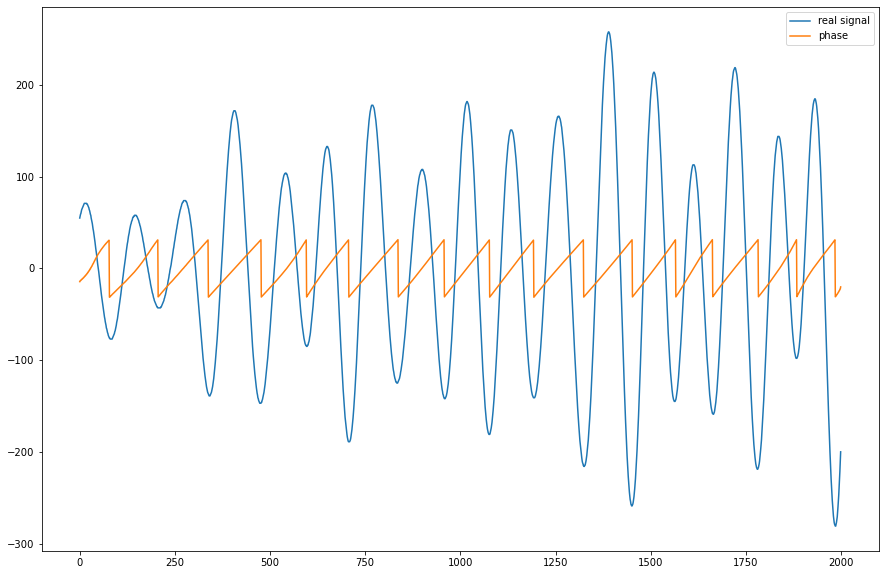

In [60]:
plt.figure(figsize=(15,10))
plt.plot(y_a.real,label='real signal')
plt.plot(y_phase*10, label='phase')
plt.legend()

Text(0.5, 0, 'time')

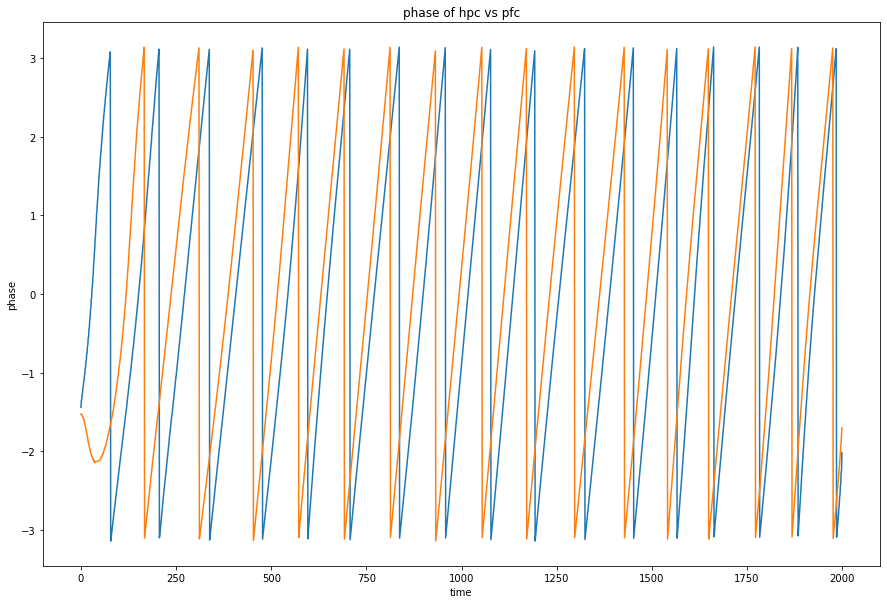

In [65]:
plt.figure(figsize=(15,10))
plt.plot(y_phase,label='pfc')
plt.plot(x_phase,label='hpc')
plt.title('phase of hpc vs pfc')
plt.ylabel('phase')
plt.xlabel('time')

#look over longer periods of time 
#compare to theta power 

In [ ]:
#try coherence with lfp 
#longer time 
#multiple times in a row to make a heat map 
#figure out bin size 


In [67]:
from spectral_connectivity import Multitaper
from spectral_connectivity import Connectivity
from spectral_connectivity import multitaper_connectivity

3

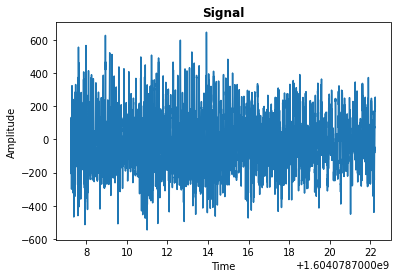

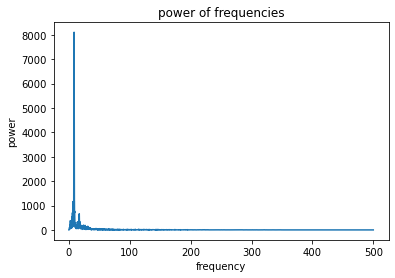

In [84]:
time = x_elect_lfp[0]
signal = y_elect_lfp[0]


# frequency_of_interest = [200, 50]
sampling_frequency = 1000
# time_extent = (0, 50)
# n_time_samples = ((time_extent[1] - time_extent[0]) * sampling_frequency) + 1
# time = np.linspace(time_extent[0], time_extent[1], num=n_time_samples, endpoint=True)
# signal = np.sin(2 * np.pi * time[:, np.newaxis] * frequency_of_interest)
# signal[:n_time_samples // 2, 1] = 0 
# signal = signal.sum(axis=1)
# noise = np.random.normal(0, 4, signal.shape)

# fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 9))
# axes[0, 0].plot(time, signal)
# axes[0, 0].set_xlabel('Time')
# axes[0, 0].set_ylabel('Amplitude')
# axes[0, 0].set_title('Signal', fontweight='bold')
# axes[0, 0].set_xlim((24.90, 25.10))
# axes[0, 0].set_ylim((-10, 10))

plt.plot(time, signal)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Signal', fontweight='bold')
# plt.xlim((24.90, 25.10))
# plt.ylim((-10, 10))



# axes[0, 1].plot(time, signal + noise)
# axes[0, 1].set_xlabel('Time')
# axes[0, 1].set_ylabel('Amplitude')
# axes[0, 1].set_title('Signal + Noise', fontweight='bold')
# axes[0, 1].set_xlim((24.90, 25.10))
# axes[0, 1].set_ylim((-10, 10))

m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=3,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
plt.figure()
plt.plot(c.frequencies, c.power().squeeze())
plt.title('power of frequencies')
plt.xlabel('frequency')
plt.ylabel('power')

m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=3,
               time_window_duration=0.600,
               time_window_step=0.300,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
mesh= axes[0].pcolormesh(c.time, c.frequencies, c.power().squeeze().T,
                             vmin=0.0, vmax=0.03, cmap='viridis')
# plt.ylim((0, 300))
# plt.axvline(time[int(np.fix(n_time_samples / 2))], color='black')







# m = Multitaper(signal + noise,
#                sampling_frequency=sampling_frequency,
#                time_halfbandwidth_product=3,
#                start_time=time[0])
# c = Connectivity(fourier_coefficients=m.fft(),
#                  frequencies=m.frequencies)
# axes[1, 1].plot(c.frequencies, c.power().squeeze())


# m = Multitaper(signal,
#                sampling_frequency=sampling_frequency,
#                time_halfbandwidth_product=3,
#                time_window_duration=0.600,
#                time_window_step=0.300,
#                start_time=time[0])
# c = Connectivity(fourier_coefficients=m.fft(),
#                  frequencies=m.frequencies,
#                  time=m.time)
# mesh = axes[2, 0].pcolormesh(c.time, c.frequencies, c.power().squeeze().T,
#                              vmin=0.0, vmax=0.03, cmap='viridis')
# axes[2, 0].set_ylim((0, 300))
# axes[2, 0].axvline(time[int(np.fix(n_time_samples / 2))], color='black')

# # m = Multitaper(signal + noise,
# #                sampling_frequency=sampling_frequency,
# #                time_halfbandwidth_product=3,
# #                time_window_duration=0.600,
# #                time_window_step=0.300,
# #                start_time=time[0])
# # c = Connectivity(fourier_coefficients=m.fft(),
# #                  frequencies=m.frequencies,
# #                  time=m.time)
# # mesh = axes[2, 1].pcolormesh(c.time, c.frequencies, c.power().squeeze().T,
# #                              vmin=0.0, vmax=0.03, cmap='viridis')
# # axes[2, 1].set_ylim((0, 300))
# # axes[2, 1].axvline(time[int(np.fix(n_time_samples / 2))], color='black')

# plt.tight_layout()
cb = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Power')
# cb.outline.set_linewidth(0)

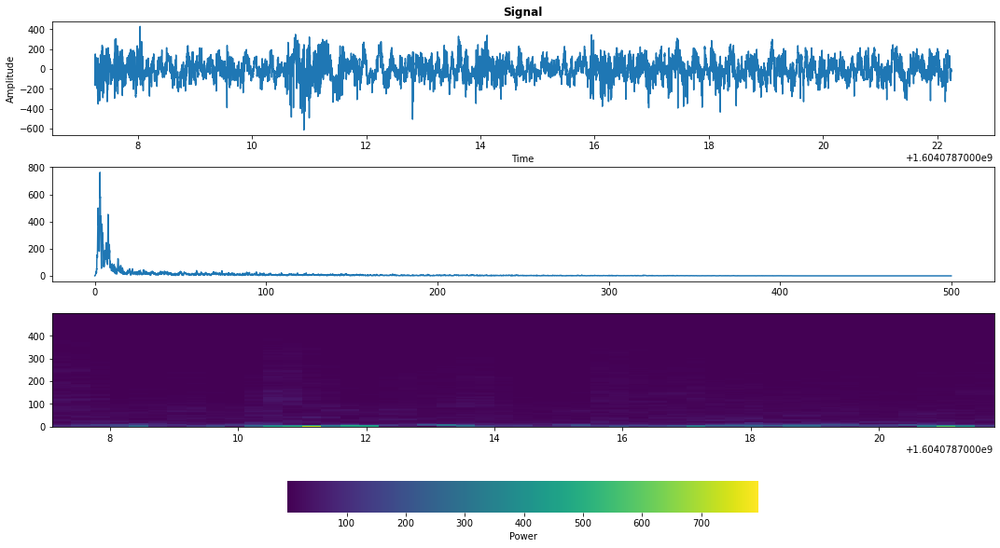

In [161]:
# frequency_of_interest = [200, 50]
sampling_frequency = 1000
# time_extent = (0, 50)
# n_time_samples = ((time_extent[1] - time_extent[0]) * sampling_frequency) + 1
# time = np.linspace(time_extent[0], time_extent[1], num=n_time_samples, endpoint=True)
# signal = np.sin(2 * np.pi * time[:, np.newaxis] * frequency_of_interest)
# signal[:n_time_samples // 2, 1] = 0 
# signal = signal.sum(axis=1)
# noise = np.random.normal(0, 4, signal.shape)
time = x_elect_lfp[2]
signal = y_elect_lfp[2]
noise = np.zeros(len(x_elect_lfp[0]))

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 9))
axes[0].plot(time, signal)
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Amplitude')
axes[0].set_title('Signal', fontweight='bold')
# axes[0, 0].set_xlim((24.90, 25.10))
# axes[0, 0].set_ylim((-10, 10))

# axes[0, 1].plot(time, signal + noise)
# axes[0, 1].set_xlabel('Time')
# axes[0, 1].set_ylabel('Amplitude')
# axes[0, 1].set_title('Signal + Noise', fontweight='bold')
# # axes[0, 1].set_xlim((24.90, 25.10))
# # axes[0, 1].set_ylim((-10, 10))

m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=3,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
axes[1].plot(c.frequencies, c.power().squeeze())

# m = Multitaper(signal + noise,
#                sampling_frequency=sampling_frequency,
#                time_halfbandwidth_product=3,
#                start_time=time[0])
# c = Connectivity(fourier_coefficients=m.fft(),
#                  frequencies=m.frequencies)
# axes[1, 1].plot(c.frequencies, c.power().squeeze())


m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=3,
               time_window_duration=0.600,
               time_window_step=0.300,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
mesh = axes[2].pcolormesh(c.time, c.frequencies, c.power().squeeze().T,
                            cmap='viridis')
# axes[2].set_ylim((0, 50))
# axes[2, 0].axvline(time[int(np.fix(n_time_samples / 2))], color='black')

# m = Multitaper(signal + noise,
#                sampling_frequency=sampling_frequency,
#                time_halfbandwidth_product=3,
#                time_window_duration=0.600,
#                time_window_step=0.300,
#                start_time=time[0])
# c = Connectivity(fourier_coefficients=m.fft(),
#                  frequencies=m.frequencies,
#                  time=m.time)
# mesh = axes[2, 1].pcolormesh(c.time, c.frequencies, c.power().squeeze().T,
#                             cmap='viridis')
# axes[2, 1].set_ylim((0, 100))
# # axes[2, 1].axvline(time[int(np.fix(n_time_samples / 2))], color='black')

plt.tight_layout()
cb = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Power')
cb.outline.set_linewidth(0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


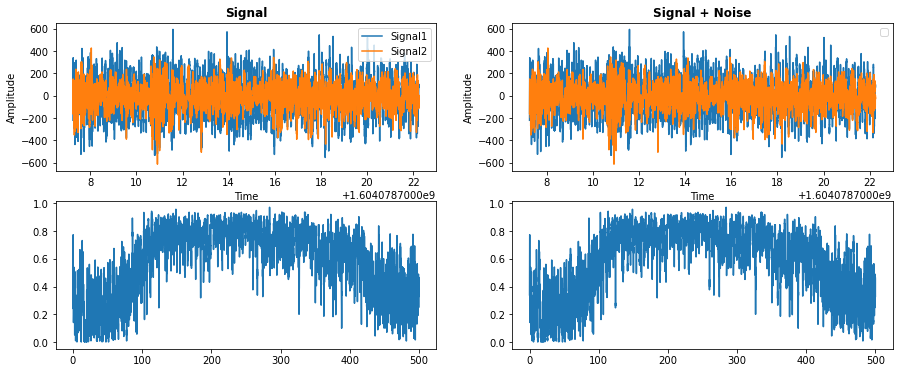

In [120]:
time_halfbandwidth_product = 5
# frequency_of_interest = 200
# sampling_frequency = 1500
# time_extent = (0, 50)
# n_signals = 2
# n_time_samples = ((time_extent[1] - time_extent[0]) * sampling_frequency) + 1
# time = np.linspace(time_extent[0], time_extent[1], num=n_time_samples, endpoint=True)
# signal = np.zeros((n_time_samples, n_signals))
# signal[:, 0] = np.sin(2 * np.pi * time * frequency_of_interest)
# phase_offset = np.pi / 2
# signal[:, 1] = np.sin((2 * np.pi * time * frequency_of_interest) + phase_offset)
# noise = np.random.normal(0, 4, signal.shape)

sampling_frequency = 1000
signal = np.zeros((len(time), 2))


signal[:,0] = y_elect_lfp[1]
signal[:,1]=y_elect_lfp[2]


time = x_elect_lfp[0]
# signal = y_elect_lfp[1]
# signal1 = y_elect_lfp[2]
noise = np.zeros((len(x_elect_lfp[0]),2))


plt.figure(figsize=(15, 6))
plt.subplot(2, 2, 1)
plt.title('Signal', fontweight='bold')
plt.plot(time, signal[:, 0], label='Signal1')
plt.plot(time, signal[:, 1], label='Signal2')
plt.xlabel('Time')
plt.ylabel('Amplitude')
# plt.xlim((0.95, 1.05))
# plt.ylim((-10, 10))
plt.legend()

plt.subplot(2, 2, 2)
plt.title('Signal + Noise', fontweight='bold')
plt.plot(time, signal + noise)
plt.xlabel('Time')
plt.ylabel('Amplitude')
# plt.xlim((0.95, 1.05))
# plt.ylim((-10, 10))
plt.legend()

m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
plt.subplot(2, 2, 3)
plt.plot(c.frequencies, c.coherence_magnitude()[0, :, 0, 1])


m = Multitaper(signal + noise,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
plt.subplot(2, 2, 4)
plt.plot(c.frequencies, c.coherence_magnitude()[0, :, 0, 1]);



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 0.98, 'hpc, pfc lfp signal')

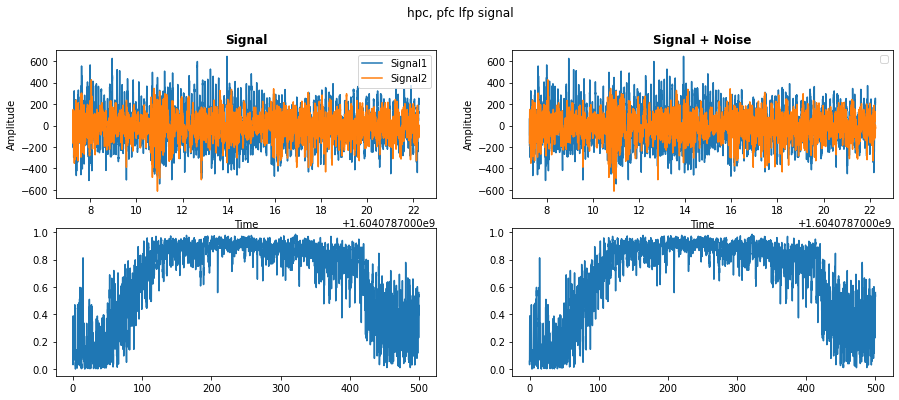

In [156]:
time_halfbandwidth_product = 5
# frequency_of_interest = 200
# sampling_frequency = 1500
# time_extent = (0, 50)
# n_signals = 2
# n_time_samples = ((time_extent[1] - time_extent[0]) * sampling_frequency) + 1
# time = np.linspace(time_extent[0], time_extent[1], num=n_time_samples, endpoint=True)
# signal = np.zeros((n_time_samples, n_signals))
# signal[:, 0] = np.sin(2 * np.pi * time * frequency_of_interest)
# phase_offset = np.pi / 2
# signal[:, 1] = np.sin((2 * np.pi * time * frequency_of_interest) + phase_offset)
# noise = np.random.normal(0, 4, signal.shape)
time = x_elect_lfp[0]


sampling_frequency = 1000
signal = np.zeros((len(time), 2))


signal[:,0] = y_elect_lfp[0]
signal[:,1]=y_elect_lfp[2]


# time = x_elect_lfp[0]
# signal = y_elect_lfp[1]
# signal1 = y_elect_lfp[2]
noise = np.zeros((len(time),2))


plt.figure(figsize=(15, 6))
plt.subplot(2, 2, 1)
plt.title('Signal', fontweight='bold')
plt.plot(time, signal[:, 0], label='Signal1')
plt.plot(time, signal[:, 1], label='Signal2')
plt.xlabel('Time')
plt.ylabel('Amplitude')
# plt.xlim((0.95, 1.05))
# plt.ylim((-10, 10))
plt.legend()

plt.subplot(2, 2, 2)
plt.title('Signal + Noise', fontweight='bold')
plt.plot(time, signal + noise)
plt.xlabel('Time')
plt.ylabel('Amplitude')
# plt.xlim((0.95, 1.05))
# plt.ylim((-10, 10))
plt.legend()

m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
plt.subplot(2, 2, 3)
plt.plot(c.frequencies, c.coherence_magnitude()[0, :, 0, 1])


m = Multitaper(signal + noise,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
plt.subplot(2, 2, 4)
plt.plot(c.frequencies, c.coherence_magnitude()[0, :, 0, 1]);

plt.suptitle('hpc, pfc lfp signal')


In [113]:
# noise = np.zeros(len(x_elect_lfp[0]),2)

# s= ()
x = np.zeros(np.shape(signal))

SyntaxError: EOL while scanning string literal (863353371.py, line 4)

In [139]:
(c.coherency)

<bound method Connectivity.coherency of <spectral_connectivity.connectivity.Connectivity object at 0x7fc0a0a5e4f0>>

In [112]:
x

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       ...,
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [117]:
x = np.zeros((2,len(x_elect_lfp[0])))

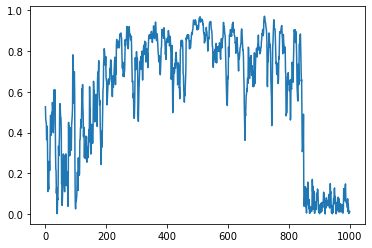

In [136]:
# plt.plot(m.frequencies)
plt.plot(c.coherence_magnitude()[0, :, 0, 1])

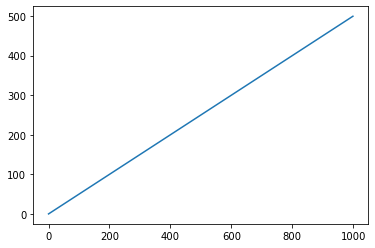

In [130]:
plt.plot(c.frequencies)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


frequency resolution: 50.0


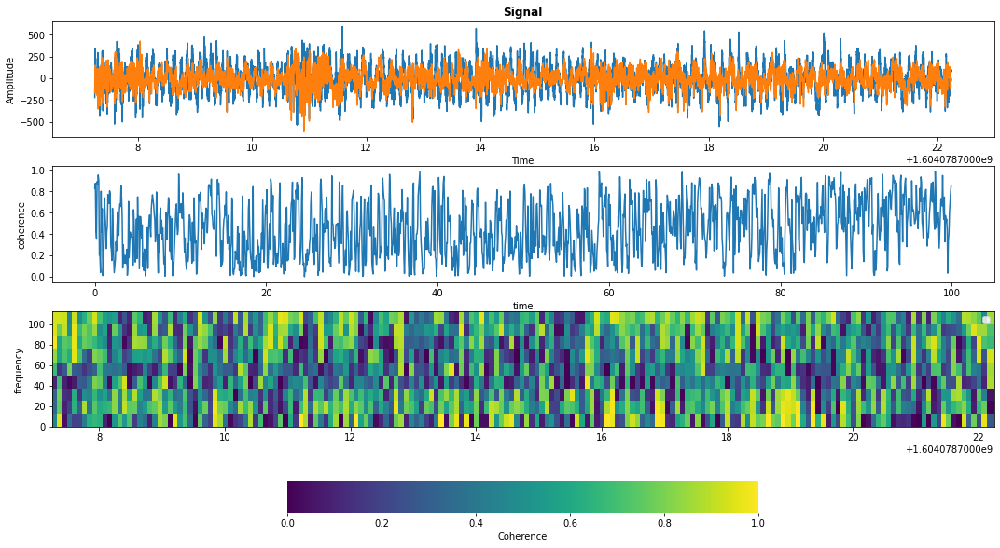

In [331]:
time_halfbandwidth_product = 2
# frequency_of_interest = 200
sampling_frequency = 1000
# time_extent = (0, 2.400)
n_trials = 100
# n_signals = 2

time = x_elect_lfp[0]
sampling_frequency = 1000
signal = np.zeros((len(time), 2))
signal[:,0] = y_elect_lfp[1]
signal[:,1]=y_elect_lfp[2]


# n_time_samples = int((
    
    
#     (time_extent[1] - time_extent[0]) * sampling_frequency) + 1)
# time = np.linspace(time_extent[0], time_extent[1], num=n_time_samples, endpoint=True)[:, np.newaxis]
# signal = np.zeros((n_time_samples, n_trials, n_signals))
# signal[:, :, 0] = np.sin(2 * np.pi * time * frequency_of_interest)
# phase_offset = np.random.uniform(-np.pi, np.pi, size=(n_time_samples, 1))
# phase_offset[np.where(time > 1.5), :] = np.pi / 2
# signal[:, :, 1] = np.sin((2 * np.pi * time * frequency_of_interest) + phase_offset)
# noise = np.random.normal(0, 1, signal.shape)

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 9))
axes[0].set_title('Signal', fontweight='bold')
axes[0].plot(time, signal[:, 0], label='Signal1')
axes[0].plot(time, signal[:, 1], label='Signal2')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Amplitude')

# axes[0].set_xlim(time)
# axes[0].set_ylim((-2, 2))
plt.legend()


m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               start_time=time[0])

c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies)
axes[1].plot(c.frequencies[[c.frequencies<100]], c.coherence_magnitude()[..., 0, 1].squeeze()[c.frequencies<100])
axes[1].set_ylabel('coherence')
axes[1].set_xlabel('frequency')

# axes[1].plot(c.frequencies, c.coherence_magnitude()[..., 0, 1].squeeze())




m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               time_window_duration=0.080,
               time_window_step=0.080,
               start_time=time[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
time_grid, freq_grid = np.meshgrid(
    np.append(c.time, time[-1]),
    np.append(c.frequencies, m.nyquist_frequency))

time_grid1= time_grid[0:10,:]
freq_grid1= freq_grid[0:10,:]
coh1= c.coherence_magnitude()[..., 0, 1].squeeze().T[0:9,:]

mesh = axes[2].pcolormesh(time_grid1,freq_grid1 , coh1,
                             vmin=0.0, vmax=1.0, cmap='viridis')
axes[2].set_ylabel('frequency')
axes[1].set_xlabel('time')



plt.tight_layout()
cb = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Coherence')
cb.outline.set_linewidth(0)
print('frequency resolution: {}'.format(m.frequency_resolution))

In [329]:
m.frequencies[0:9]

array([  0. ,  12.5,  25. ,  37.5,  50. ,  62.5,  75. ,  87.5, 100. ])

In [315]:
c.coherence_magnitude()[..., 0, 1].squeeze().T.shape
freq_grid.shape
time_grid.shape

(41, 188)

In [320]:
mesh

In [274]:
c.coherence_magnitude()[..., 0, 1].squeeze().T[0:10,

array([2.13262878e-01, 3.71707951e-01, 2.58193996e-01, 8.82699507e-01,
       5.71434481e-01, 5.67092226e-02, 7.32501889e-01, 7.96404599e-01,
       7.22977843e-01, 1.01168598e-01, 5.84523826e-01, 6.14251344e-01,
       7.18620255e-01, 7.63443042e-01, 9.61033688e-03, 6.03828809e-01,
       7.74116587e-01, 9.91943935e-01, 8.05187472e-02, 7.39484126e-01,
       6.53070447e-02, 1.78471638e-01, 1.08898200e-01, 6.25231083e-01,
       8.74219269e-01, 9.48754003e-01, 5.43976244e-02, 1.39193965e-01,
       2.23578468e-05, 9.79727626e-01, 4.59348478e-02, 9.52119451e-03,
       3.48592492e-01, 8.60082318e-01, 3.81880677e-04, 6.85146028e-01,
       1.72667632e-01, 2.50411452e-01, 9.82250852e-01, 9.11406949e-01,
       7.29038244e-01, 7.64764746e-01, 9.83603812e-03, 8.91566270e-03,
       1.00066638e-01, 1.99135911e-01, 9.66707793e-01, 3.70944776e-02,
       2.32097231e-01, 4.95816273e-01, 6.10285864e-01, 3.14933115e-01,
       7.55553415e-01, 1.71600979e-01, 5.12512656e-01, 5.42634987e-01,
      

In [292]:
time_grid1= time_grid[0:10,:]

In [293]:
time_grid1= time_grid[0:10,:]
freq_grid1= freq_grid[0:10,:]
coh1= c.coherence_magnitude()[..., 0, 1].squeeze().T[0:9,:]

In [294]:
coh1= c.coherence_magnitude()[..., 0, 1].squeeze().T[0:9,:]

In [295]:
mesh = axes[2].pcolormesh(time_grid1,freq_grid1 , coh1,
                             vmin=0.0, vmax=1.0, cmap='viridis')

In [296]:
plt.tight_layout()
 = fig.colorbar(mesh, ax=axes.ravel().tolist(), orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Coherence')
cb.outline.set_linewidth(0)
# print('frequency resolution: {}'.format(m.frequency_resolution))

frequency resolution: 50.0


<Figure size 432x288 with 0 Axes>

In [229]:
# plt.plot(
    
freq_masked = c.frequencies[c.frequencies<100]

In [277]:
time_grid.shape

(41, 188)

In [275]:
c.time

array([1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
       1.60407871e+09, 1.60407871e+09, 1.60407871e+09, 1.60407871e+09,
      

In [230]:
# plt.plot(
freq_masked = c.frequencies[c.frequencies<100]
coh_masked = c.coherence_magnitude()[..., 0, 1].squeeze()[c.frequencies<100]
plt.plot(freq_masked,coh_masked)

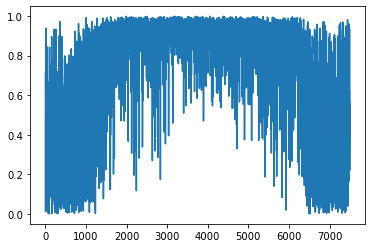

In [207]:
plt.plot(c.coherence_magnitude()[..., 0, 1].squeeze())#[c.frequencies<100][0]

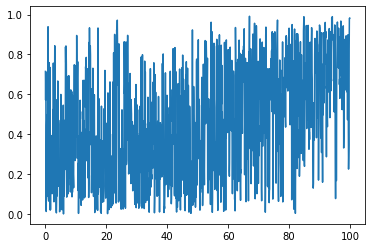

In [231]:
plt.plot(freq_masked,coh_masked)

In [251]:
freq_grid.shape
time_grid.shape
#41,188... 

(41, 188)

In [254]:
time[-1]

1604078722.2460349

In [216]:
c.coherence_magnitude()[..., 0, 1].squeeze().shape

(7500,)

In [249]:
m.nyquist_frequency

500.0

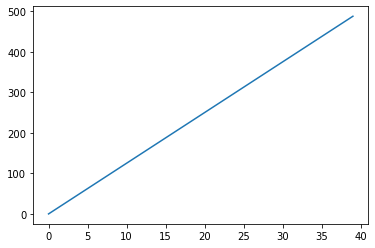

In [260]:
plt.plot(c.frequencies)

In [242]:
# time_grid.shape
freq_grid.shape

(41, 188)

In [262]:
(c.time).shape
(c.frequencies).shape
#so dimensions of freq_grid/time_grid are the shape of c.time+1,c.frequencies+1

(40,)

In [160]:
#I need to ask somebody about this i think. I should just do my own manual coherence over time 

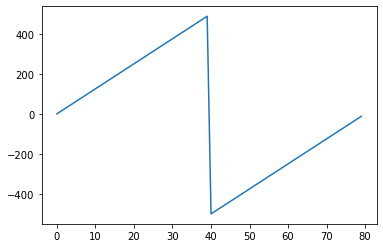

In [175]:
plt.plot(m.frequencies)